# TV-Series exploration

In [5]:
from pathlib import Path
import pandas as pd

In [18]:
splits_path = Path("/mnt/archive/common/datasets/tvseries/splits")
assert splits_path.exists()

label_path = splits_path / "classes.txt"
assert label_path.exists()

test_path = splits_path / "test.txt"
assert test_path.exists()

In [22]:
labels = pd.read_csv(str(label_path), sep="\t", header=None)
labels.columns = ["class_name", "num_instances"]
labels

,class_name,num_instances
0,Pick something up,939
1,Point,559
2,Drink,440
3,Stand up,411
4,Run,395
5,Sit down,315
6,Read,305
7,Smoke,292
8,Drive car,251
9,Open door,237


In [25]:
list(labels["class_name"])

['Pick something up',
 'Point',
 'Drink',
 'Stand up',
 'Run',
 'Sit down',
 'Read',
 'Smoke',
 'Drive car',
 'Open door',
 'Give something',
 'Use computer',
 'Write',
 'Close door',
 'Go down stairway',
 'Go up stairway',
 'Throw something',
 'Get in/out of car',
 'Hang up phone',
 'Eat',
 'Answer phone',
 'Clap',
 'Dress up',
 'Undress',
 'Kiss',
 'Fall/trip',
 'Wave',
 'Pour',
 'Punch',
 'Fire weapon']

In [17]:
data = pd.read_csv(str(test_path), sep="\t", header=None)
data.columns = [
    "video",   # series name and episode number (Name_Of_The_Series_epNUMBER)
    "class",  # class name (same as in classes.txt)
    "start_sec",   # start of the action (in seconds)
    "end_sec",   # end of the action (in seconds)
    "single_person",   # only one person visible? (yes/no (1/0))
    "atypical",  # atypical action instance (the person does something that is unusual for this action)? (yes/no)
    "shotcut",  # shotcut during action? (yes/no)
    "moving_cam",  # moving camera during action? (yes/no)
    "small_subject",  # person is very small or in background? (yes/no)
    "front_view",  # action is recorded from the front? (yes/no)
    "side_view",  # action is recorded from the side? (yes/no)
    "unusual_view",  # action is recorded from an unusual viewpoint? (yes/no)
    "occluded",  # action is (partly) spatially occluded (by object/person/...)? (yes/no)
    "truncated",  # action is spatially truncated (by frame border)? (yes/no)
    "no_beginning",  # beginning of the action is missing? (yes/no)
    "no_end",  # end of the action is missing? (yes/no)
    "comments",  # comments concerning the content of the action or the degree of occlusion and truncation (optional)
]
data.head()

,video,class,start_sec,end_sec,single_person,atypical,shotcut,moving_cam,small_subject,front_view,side_view,unusual_view,occluded,truncated,no_beginning,no_end,comments
0,Breaking_Bad_ep3,Pick something up,16.76,17.40,1,0,0,0,0,0,0,1,1,0,0,0,NaN
1,Breaking_Bad_ep3,Pour,17.80,20.12,1,1,0,0,0,0,0,1,1,1,0,1,NaN
2,Breaking_Bad_ep3,Sit down,21.16,22.72,1,1,0,0,0,0,0,1,1,0,0,0,NaN
3,Breaking_Bad_ep3,Pour,36.16,40.48,0,1,0,1,0,0,1,0,0,1,1,0,NaN
4,Breaking_Bad_ep3,Write,45.56,51.28,0,1,1,1,0,1,1,0,0,1,1,1,NaN


## Dataloader

In [1]:
import sys
sys.path.remove('/home/lh/projects/cost-gcn')
sys.path

['/home/lh/projects/co3d/notebooks',
 '/opt/anaconda/lib/python38.zip',
 '/opt/anaconda/lib/python3.8',
 '/opt/anaconda/lib/python3.8/lib-dynload',
 '',
 '/home/lh/.local/lib/python3.8/site-packages',
 '/opt/anaconda/lib/python3.8/site-packages',
 '/home/lh/projects/co3d',
 '/opt/anaconda/lib/python3.8/site-packages/locket-0.2.1-py3.8.egg',
 '/home/lh/.local/lib/python3.8/site-packages/IPython/extensions',
 '/home/lh/.ipython']

In [2]:
# Get data
from ride.utils.env import DATASETS_PATH
from datasets.dataloader import train_val_test

train_ds, val_ds, test_ds = train_val_test(
    data_path=str(DATASETS_PATH / "tvseries" / "data"),
    annotation_path=str(DATASETS_PATH / "tvseries" / "splits"),
    frames_per_clip=200,
    step_between_clips=100,
    temporal_downsampling=6,
    test_ensemble=False,
    normalisation_style="none"
)

ride: Environment:
  CACHE_PATH: .cache
  DATASETS_PATH: /home/lh/datasets
  LOGS_PATH: /mnt/archive/lh/hags/logs
  LOG_LEVEL: DEBUG
  NUM_CPU: '104'
  RUN_LOGS_PATH: /mnt/archive/lh/hags/logs/run_logs
  TUNE_LOGS_PATH: /mnt/archive/lh/hags/logs/tune_logs

/home/lh/.local/lib/python3.8/site-packages/torchvision/transforms/_functional_video.py:5: UserWarning: The _functional_video module is deprecated. Please use the functional module instead.
  warnings.warn(
/home/lh/.local/lib/python3.8/site-packages/torchvision/transforms/_transforms_video.py:25: UserWarning: The _transforms_video module is deprecated. Please use the transforms module instead.
  warnings.warn(


In [9]:
x, y, i = train_ds[300]
x.shape, y, i

(torch.Size([3, 200, 240, 240]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 8, 8, 8, 8, 3,
         1, 1, 1, 1, 3, 3, 3, 3]),
 4)

## Video visualisation

matplotlib: Animation.save using <class 'matplotlib.animation.HTMLWriter'>


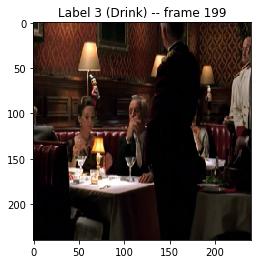

In [10]:
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from datasets.transforms import discard_audio
from IPython.display import HTML

# Scikit-Image
def display_frames(data, labels):
    num_frames = data.shape[0]
    fig, ax = plt.subplots()
    data = data.permute(1,2,3,0) # T,H,W,C
    im = data[0,:,:,:]
    image = ax.imshow(im, interpolation='None', animated=True)
    
    cmap = plt.get_cmap('hsv',10)

    def animate(i):
        im = data[i,:,:,:]
        lbl = labels[i]
        image.set_data(im)
        ax.set_title(f"Label {lbl} ({train_ds.classes[lbl]}) -- frame {i}")
        return (image, )

    anim = animation.FuncAnimation(
        fig, animate, frames=data.shape[0], interval=200, blit=True
    )
    return HTML(anim.to_jshtml())

display_frames(x, y)